# Data Preparation

In [1]:
from google.colab import drive # the real images data files take too long (about 17 minutes) to be downloaded, so we just mount it
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!tar -xzf /content/drive/MyDrive/nuimages/nuimages-v1.0-all-metadata.tgz && tar -xzf /content/drive/MyDrive/nuimages/nuimages-v1.0-all-samples.tgz # this will take about 7 minutes

In [3]:
drive.flush_and_unmount()

In [4]:
!mkdir train2017 val2017 annotations

In [5]:
import sys
sys.path.append('/content/') # path where data_preparation.py is. Modify accordingly if needed

# import importlib # use this if you make changes to the data_preparation.py and want to reflect the changes in the notebook
# importlib.reload(data_preparation)

import data_preparation

In [6]:
val_df = data_preparation.data_json_to_joined_df('/content/v1.0-val/',1, random_sample=False)
train_df = data_preparation.data_json_to_joined_df('/content/v1.0-train/',1, random_sample=False)

In [7]:
data_preparation.create_image_filename_list_txt('train', train_df)
data_preparation.create_image_filename_list_txt('val', val_df)

In [8]:
data_preparation.df_to_coco_format(val_df, '/content/v1.0-val/', 'val')
data_preparation.df_to_coco_format(train_df, '/content/v1.0-train/', 'train')

In [9]:
# make sure the val.txt exists before running this
# copy the val image to directory expected by yolo. should take about 1 minute for the entire dataset
!xargs -a val.txt -P8 -I{} cp "/content/{}" /content/val2017/

In [10]:
# make sure the train.txt exists before running this
# copy the train image to directory expected by yolo. should take about 5 minutes for the entire dataset
!xargs -a train.txt -P8 -I{} cp "/content/{}" /content/train2017/

loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
File name:  n015-2018-09-05-10-54-58+0800__CAM_BACK__1536116636687525.jpg
Image path:  /content/train2017/n015-2018-09-05-10-54-58+0800__CAM_BACK__1536116636687525.jpg


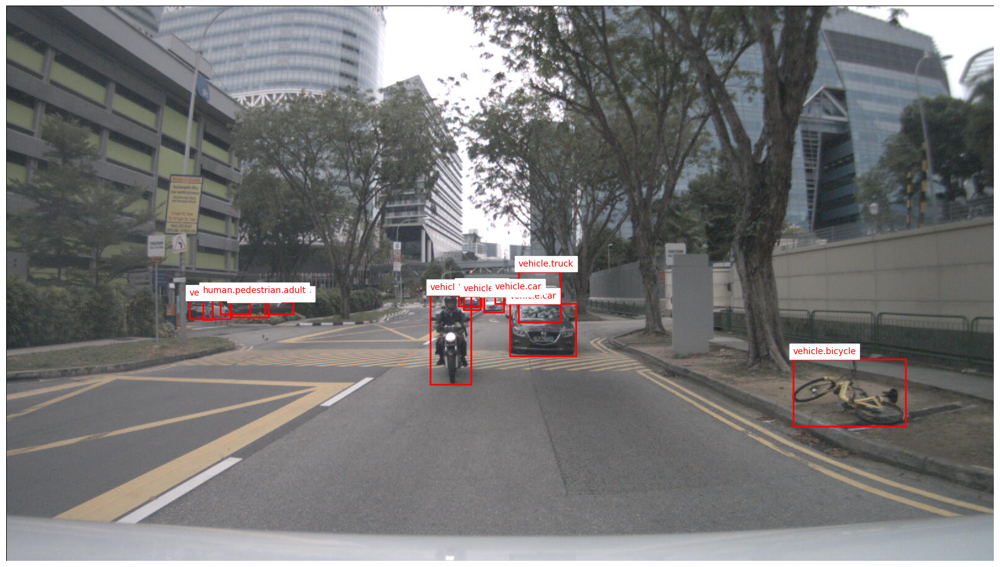

In [15]:
data_preparation.display_image_from_coco_json('/content/train.json', '/content/train2017/')

# Detectron2 part
This part is made based on https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5. Read the notebook to see more explanation.

# Install detectron2

In [16]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 21.5 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15875, done.
remote: Counting objects: 100% (93/93), done.
remote: Compressing objects: 100% (77/77), done.
remote: Total 15875 (delta 46), reused 17 (delta 16), pack-reused 15782 (from 3)
Receiving objects: 100% (15875/15875), 6.43 MiB | 21.02 MiB/s, done.
Resolving deltas: 100% (11549/11549), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your en

In [17]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.6 ; cuda:  cu124
detectron2: 0.6


In [18]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [19]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("my_dataset_train", {}, "/content/train.json", "/content/train2017/")
register_coco_instances("my_dataset_val", {}, "/content/val.json", "/content/val2017/")

## Training

**Important:** Modify `cfg.MODEL.ROI_HEADS.NUM_CLASSES `accordingly before running the training


In [38]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512

# Important: modify this according to the actual number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 25  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

# since we only want to train the object detection, set to False
cfg.MODEL.MASK_ON = False

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/19 14:26:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.mask_head.mask_fcn1.{bias, weight}
  roi_heads.mask_head.mask_fcn2.{bias, weight}
  roi_heads.mask_head.mask_fcn3.{bias, weight}
  roi_heads.mask_head.mask_fcn4.{bias, weight}
  roi_heads.mask_head.deconv.{bias, weight}
  roi_heads.mask_head.predictor.{bias, weight}


[06/19 14:26:31 d2.engine.train_loop]: Starting training from iteration 0
[06/19 14:26:41 d2.utils.events]:  eta: 0:03:52  iter: 19  total_loss: 3.842  loss_cls: 3.15  loss_box_reg: 0.5031  loss_rpn_cls: 0.07556  loss_rpn_loc: 0.1154    time: 0.4796  last_time: 0.4836  data_time: 0.0226  last_data_time: 0.0092   lr: 9.7405e-06  max_mem: 8182M
[06/19 14:26:50 d2.utils.events]:  eta: 0:03:43  iter: 39  total_loss: 3.554  loss_cls: 2.912  loss_box_reg: 0.4776  loss_rpn_cls: 0.0865  loss_rpn_loc: 0.09462    time: 0.4789  last_time: 0.4910  data_time: 0.0094  last_data_time: 0.0103   lr: 1.9731e-05  max_mem: 8182M
[06/19 14:27:00 d2.utils.events]:  eta: 0:03:33  iter: 59  total_loss: 2.935  loss_cls: 2.262  loss_box_reg: 0.41  loss_rpn_cls: 0.07135  loss_rpn_loc: 0.06264    time: 0.4809  last_time: 0.4883  data_time: 0.0092  last_data_time: 0.0091   lr: 2.972e-05  max_mem: 8182M
[06/19 14:27:10 d2.utils.events]:  eta: 0:03:23  iter: 79  total_loss: 2.147  loss_cls: 1.377  loss_box_reg: 0.52

In [39]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model



In [40]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[06/19 14:30:56 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

---



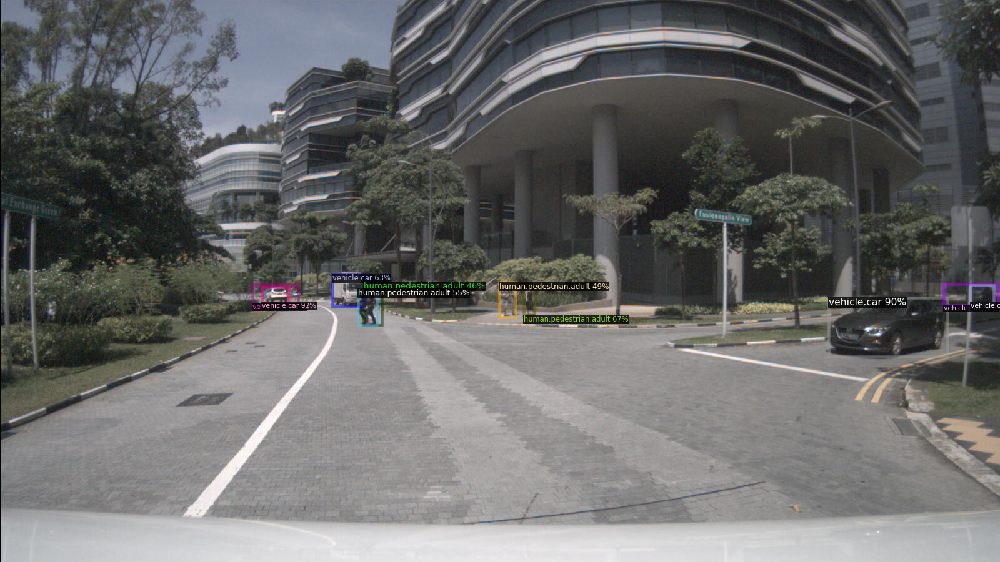

In [41]:
from detectron2.utils.visualizer import ColorMode

metadata = MetadataCatalog.get("my_dataset_train")

im = cv2.imread("/content/val2017/n016-2018-07-05-12-20-03+0800__CAM_BACK__1530764582937551.jpg")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                metadata=metadata,
                scale=1.0,
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

Evaluate the performance.

In [42]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[06/19 14:31:09 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [06/19 14:31:09 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/19 14:31:09 d2.data.datasets.coco]: Loaded 148 images in COCO format from /content/val.json
[06/19 14:31:09 d2.data.build]: Distribution of instances among all 25 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|    animal     | 1            | flat.drivea.. | 0            | human.pedes.. | 343          |
| human.pedes.. | 2            | human.pedes.. | 40           | human.pedes.. | 13           |
| human.pedes.. | 0            | human.pedes.. | 1            | human.pedes.. | 0            |
| movable_obj.. | 136          | movable_obj.. | 5            | movable_obj.. | 8            |
